In [59]:
using JuMP
import Ipopt
using StaticArrays, LinearAlgebra
using Plots
using Symbolics: Symbolics, @variables, scalarize
using Latexify
using BlockArrays: Block, BlockVector, mortar, blocksizes
using Ipopt
using SparseArrays
using CSV
using DataFrames
using Tables

In [100]:
function uni_dyna(x,u)
    return [x[1]+dt*u[1]*cos(x[3]), x[2]+dt*u[1]*sin(x[3]), x[3]+dt*u[2]]
end

function circleShape(h, k, r); gr()
    theta = LinRange(0, 2*pi, 500)
    h.+ r*sin.(theta), k.+ r*cos.(theta)
end

N = 100
n_x = 9
n_u = 6
state_dimension = 3
control_dimension = 2
horizon = N
tf = 10.
dt = tf/(N)
u1_b = 0.15
u2_b = 0.75

xo = @SVector [5.0,10.0*sin(pi/3)/3]
ro = 1.55
ra = 3

# Q = 50.0*Diagonal(@SVector ones(6))
# Qf = 10000.0*Diagonal(@SVector ones(6))
# R = 1.0e0*Diagonal(@SVector ones(4))

Q = Diagonal(@SVector [50, 10, 5, 50, 10, 5, 50, 10, 5, 5, 5, 5, 2, 2, 2])*0.6 # This is reference tracking and control cost
Qf = Diagonal(@SVector [50, 10, 5, 50, 10, 5, 50, 10, 5, 5, 5, 5, 2, 2, 2])*50
R = Diagonal(@SVector [10, 10, 10, 5, 5, 5])*0.8

noise_level = 0.25

full_traj = []

num_sim = 1000

sim = 1

while sim<=num_sim

    x0 = [0,0,pi/6,10,0,pi-pi/6,10*cos(pi/3),10*sin(pi/3), -pi/2] + [noise_level*(2*rand()-1), noise_level*(2*rand()-1), 0, noise_level*(2*rand()-1), noise_level*(2*rand()-1), 0, noise_level*(2*rand()-1), noise_level*(2*rand()-1), 0]
    xf = [10*cos(pi/6),10*sin(pi/6),pi/6,
    10-10*cos(pi/6),10*sin(pi/6),pi - pi/6,
    10*cos(pi/3),10*sin(pi/3)-10, -pi/2] + [noise_level*(2*rand()-1), noise_level*(2*rand()-1), 0, noise_level*(2*rand()-1), noise_level*(2*rand()-1), 0, noise_level*(2*rand()-1), noise_level*(2*rand()-1), 0]

    # xf2 = @SVector [20,-2,0,0,-2,pi]

    X_ref = hcat(collect(LinRange(x0[1],xf[1],N+1)), 
            collect(LinRange(x0[2],xf[2],N+1)),
            collect(LinRange(x0[3],xf[3],N+1)),
            collect(LinRange(x0[4],xf[4],N+1)), 
            collect(LinRange(x0[5],xf[5],N+1)),
            collect(LinRange(x0[6],xf[6],N+1)),
            collect(LinRange(x0[7],xf[7],N+1)), 
            collect(LinRange(x0[8],xf[8],N+1)),
            collect(LinRange(x0[9],xf[9],N+1)), zeros(N+1),zeros(N+1), zeros(N+1),zeros(N+1), zeros(N+1),zeros(N+1))

    problem_size = N*(n_x+n_u)

    model = Model(Ipopt.Optimizer)

    @variable(model, x11[1:N+1])
    @variable(model, x12[1:N+1])
    @variable(model, x13[1:N+1])
    @variable(model, x21[1:N+1])
    @variable(model, x22[1:N+1])
    @variable(model, x23[1:N+1])
    @variable(model, x31[1:N+1])
    @variable(model, x32[1:N+1])
    @variable(model, x33[1:N+1])

    @variable(model, 0<=u11[1:N+1] , start = 0)
    @variable(model, u12[1:N+1], start = 0);
    @variable(model, 0<=u21[1:N+1], start = 0)
    @variable(model, u22[1:N+1], start = 0);
    @variable(model, 0<=u31[1:N+1], start = 0)
    @variable(model, u32[1:N+1], start = 0);

    @variable(model, -u1_b <= du11[1:N+1] <= u1_b, start = 0)
    @variable(model, -u2_b <= du12[1:N+1] <= u2_b, start = 0);
    @variable(model, -u1_b <= du21[1:N+1] <= u1_b, start = 0)
    @variable(model, -u2_b <= du22[1:N+1] <= u2_b, start = 0);
    @variable(model, -u1_b <= du31[1:N+1] <= u1_b, start = 0)
    @variable(model, -u2_b <= du32[1:N+1] <= u2_b, start = 0);

    fix(x11[1],x0[1],force=true)
    fix(x12[1],x0[2],force=true)
    fix(x13[1],x0[3],force=true)
    fix(x21[1],x0[4],force=true)
    fix(x22[1],x0[5],force=true)
    fix(x23[1],x0[6],force=true)
    fix(x31[1],x0[7],force=true)
    fix(x32[1],x0[8],force=true)
    fix(x33[1],x0[9],force=true)

    fix(u11[N+1],0.0,force=true)
    fix(u12[N+1],0.0,force=true)
    fix(u21[N+1],0.0,force=true)
    fix(u22[N+1],0.0,force=true)
    fix(u31[N+1],0.0,force=true)
    fix(u32[N+1],0.0,force=true)

    fix(du11[N+1],0.0,force=true)
    fix(du12[N+1],0.0,force=true)
    fix(du21[N+1],0.0,force=true)
    fix(du22[N+1],0.0,force=true)
    fix(du31[N+1],0.0,force=true)
    fix(du32[N+1],0.0,force=true)

    X_full= vcat(x11',x12',x13',x21',x22',x23',x31',x32',x33',u11',u21',u31',u12',u22',u32')

    U_full = vcat(u11',u21',u31',u12',u22',u32')

    @objective(model, Min, tr((X_full'[1:N,:] - X_ref[1:N,:])*Q*(X_full[:,1:N] - X_ref'[:,1:N])) + tr(U_full'*R*U_full) + (X_full'[1+N,:] - X_ref[1+N,:])'*Qf*(X_full[:,1+N] - X_ref'[:,1+N]))

    @constraint(model, [t in 1:N], uni_dyna([x11[t],x12[t],x13[t]],[u11[t],u12[t]]) == [x11[t+1],x12[t+1],x13[t+1]]);
    @constraint(model, [t in 1:N], uni_dyna([x21[t],x22[t],x23[t]],[u21[t],u22[t]]) == [x21[t+1],x22[t+1],x23[t+1]]);
    @constraint(model, [t in 1:N], uni_dyna([x31[t],x32[t],x33[t]],[u31[t],u32[t]]) == [x31[t+1],x32[t+1],x33[t+1]]);
    @constraint(model, [t in 1:N], [u21[t]+du21[t+1],u22[t]+du22[t+1]] == [u21[t+1],u22[t+1]]);
    @constraint(model, [t in 1:N], [u11[t]+du11[t+1],u12[t]+du12[t+1]] == [u11[t+1],u12[t+1]]);
    @constraint(model, [t in 1:N], [u31[t]+du31[t+1],u32[t]+du32[t+1]] == [u31[t+1],u32[t+1]]);
    @constraint(model, [t in 1:N+1], (x21[t] - x11[t])^2 + (x22[t] - x12[t])^2 - ra^2 >= 0);
    @constraint(model, [t in 1:N+1], (x31[t] - x11[t])^2 + (x32[t] - x12[t])^2 - ra^2 >= 0);
    @constraint(model, [t in 1:N+1], (x31[t] - x21[t])^2 + (x32[t] - x22[t])^2 - ra^2 >= 0);
    @constraint(model, [t in 1:N+1], (xo[1] - x11[t])^2 + (xo[2] - x12[t])^2 - ro^2 >= 0);
    @constraint(model, [t in 1:N+1], (xo[1] - x21[t])^2 + (xo[2] - x22[t])^2 - ro^2 >= 0);
    @constraint(model, [t in 1:N+1], (xo[1] - x31[t])^2 + (xo[2] - x32[t])^2 - ro^2 >= 0);

    for i in 1:N+1
        set_start_value(x11[i],X_ref[i,1]+ 0.1*(2*rand()-1))
        set_start_value(x12[i],X_ref[i,2]+ 0.1*(2*rand()-1))
        set_start_value(x13[i],X_ref[i,3]+ 0.1*(2*rand()-1))
        set_start_value(x21[i],X_ref[i,4]+ 0.1*(2*rand()-1))
        set_start_value(x22[i],X_ref[i,5]+ 0.1*(2*rand()-1))
        set_start_value(x23[i],X_ref[i,6]+ 0.1*(2*rand()-1))
        set_start_value(x31[i],X_ref[i,7]+ 0.1*(2*rand()-1))
        set_start_value(x32[i],X_ref[i,8]+ 0.1*(2*rand()-1))
        set_start_value(x33[i],X_ref[i,9]+ 0.1*(2*rand()-1))

        set_start_value(u11[i],X_ref[i,10])
        set_start_value(u21[i],X_ref[i,11])
        set_start_value(u31[i],X_ref[i,12])
        set_start_value(u12[i],X_ref[i,13])
        set_start_value(u22[i],X_ref[i,14])
        set_start_value(u32[i],X_ref[i,15])

        set_start_value(du11[i],0.0)
        set_start_value(du12[i],0.0)
        set_start_value(du21[i],0.0)
        set_start_value(du22[i],0.0)
        set_start_value(du31[i],0.0)
        set_start_value(du32[i],0.0)
        
    end

    optimize!(model)

    if is_solved_and_feasible(model)

        X1 = hcat(value.(x11),value.(x12),value.(x13))
        X2 = hcat(value.(x21),value.(x22),value.(x23))
        X3 = hcat(value.(x31),value.(x32),value.(x33))

        traj = hcat(value.(u11),value.(u12),value.(u21),value.(u22), value.(u31),value.(u32),
                    value.(x11),value.(x12),value.(x13), 
                    value.(x21),value.(x22),value.(x23),
                    value.(x31),value.(x32),value.(x33))

        if maximum(X1[:,2]) < 5.5 && maximum(X2[:,2]) < 5.5 && minimum(X1[:,2]) > -1 && minimum(X2[:,2]) > -1

            if sim == 1
                full_traj = traj[1:100,:]
                Plots.plot(X1[:,1],X1[:,2],color="blue",label="Agent 1")
                Plots.plot!(X2[:,1],X2[:,2],color="orange",label="Agent 2")
                Plots.plot!(X3[:,1],X3[:,2],color="green",label="Agent 3")
                # Plots.plot(circleShape(xo[1], xo[2], ro), seriestype = [:shape, ], lw=0.5, c = :gray, linecolor = :white, legend = false, fillalpha = 0.2, aspect_ratio = 1)
            else
                full_traj = vcat(full_traj,traj[1:100,:])
                Plots.plot!(X1[:,1],X1[:,2],color = "blue",label="")
                Plots.plot!(X2[:,1],X2[:,2],color="orange",label="")
                Plots.plot!(X3[:,1],X3[:,2],color="green",label="")
            end
            sim += 1
        end
    end 
end

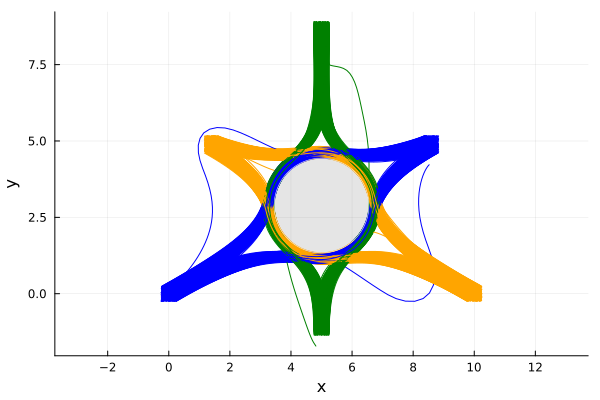

In [101]:
Plots.plot!(circleShape(xo[1], xo[2], ro), seriestype = [:shape, ], lw=0.5, c = :gray, linecolor = :white, legend = false, fillalpha = 0.2, aspect_ratio = 1)
Plots.xlabel!("x")
Plots.ylabel!("y")
# make the aspect_ratio 1

In [105]:
size(full_traj,1)

100000

In [109]:
CSV.write("data/three_agents_trajs_noise_0_25.csv", Tables.table(full_traj), writeheader=true)

"data/three_agents_trajs_noise_0_25.csv"